# Data visualization Project

- Dragomir Elena Alexandra , 507
- Apostu Alexandru-Mihai, 507

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
import scipy
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, mean_absolute_error, mean_squared_error, r2_score, median_absolute_error
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR

warnings.filterwarnings('ignore')

/tmp/ipykernel_55505/1117298800.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


## EDA 

In [2]:
df = pd.read_csv("diamonds.csv")

In [3]:
df.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'price', 'x', 'y',
       'z'],
      dtype='object')

In [4]:
df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


In [6]:
# Extract unique values for categorical columns
unique_values = {col: df[col].unique() for col in df.select_dtypes(include='object').columns}
# There are no placeholder categorical values either
unique_values

{'cut': array(['Ideal', 'Premium', 'Good', 'Very Good', 'Fair'], dtype=object),
 'color': array(['E', 'I', 'J', 'H', 'F', 'G', 'D'], dtype=object),
 'clarity': array(['SI2', 'SI1', 'VS1', 'VS2', 'VVS2', 'VVS1', 'I1', 'IF'],
       dtype=object)}

In [7]:
# Calculate the range for each numerical column
numerical_columns = ['carat', 'depth', 'table', 'price', 'x', 'y', 'z']
ranges = {column: (df[column].min(), df[column].max()) for column in numerical_columns}

print(ranges)

{'carat': (0.2, 5.01), 'depth': (43.0, 79.0), 'table': (43.0, 95.0), 'price': (326, 18823), 'x': (0.0, 10.74), 'y': (0.0, 58.9), 'z': (0.0, 31.8)}


In [8]:
df.describe()

,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [9]:
df

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53935,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53936,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53937,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53938,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74


In [10]:
df.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'price', 'x', 'y',
       'z'],
      dtype='object')

### Data Checks and Cleanup

In [11]:
# Check for any zero values in 'x', 'y', 'z' columns
zero_dimensions_xyz = df[(df['x'] == 0) | (df['y'] == 0) | (df['z'] == 0)]
zero_dimensions_xyz

,carat,cut,color,clarity,depth,table,price,x,y,z
2207,1.00,Premium,G,SI2,59.1,59.0,3142,6.55,6.48,0.0
2314,1.01,Premium,H,I1,58.1,59.0,3167,6.66,6.60,0.0
4791,1.10,Premium,G,SI2,63.0,59.0,3696,6.50,6.47,0.0
5471,1.01,Premium,F,SI2,59.2,58.0,3837,6.50,6.47,0.0
10167,1.50,Good,G,I1,64.0,61.0,4731,7.15,7.04,0.0
11182,1.07,Ideal,F,SI2,61.6,56.0,4954,0.00,6.62,0.0
11963,1.00,Very Good,H,VS2,63.3,53.0,5139,0.00,0.00,0.0
13601,1.15,Ideal,G,VS2,59.2,56.0,5564,6.88,6.83,0.0
15951,1.14,Fair,G,VS1,57.5,67.0,6381,0.00,0.00,0.0
24394,2.18,Premium,H,SI2,59.4,61.0,12631,8.49,8.45,0.0


In [12]:
zero_dimensions_xyz.shape

(20, 10)

In [13]:
# Check for any zero values in other columns
zero_dimensions = df[(df['depth'] == 0) | (df['table'] == 0) | (df['price'] == 0)]
zero_dimensions.shape # We got zero rows, and 10 columns, which means there are no other zero-values in the dataset

(0, 10)

## Plots

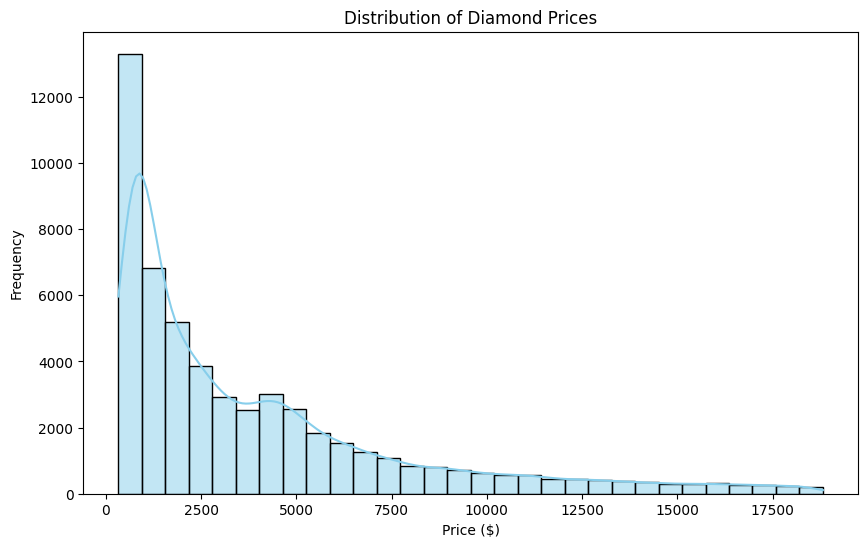

In [14]:
# Distribution of diamond prices
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='price', bins=30, kde=True, color='skyblue')
plt.title('Distribution of Diamond Prices')
plt.xlabel('Price ($)')
plt.ylabel('Frequency')
plt.show()

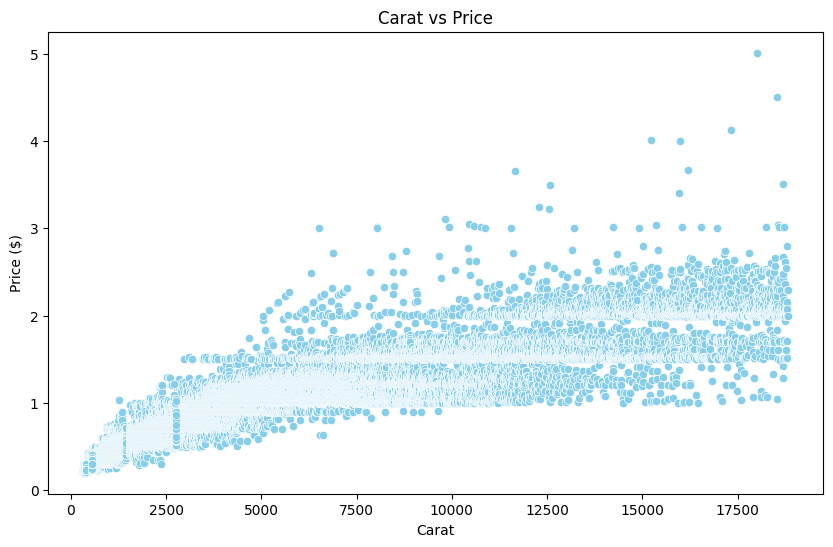

In [15]:
# Scatter plot of carat vs price
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='price', y='carat', color='skyblue')
plt.title('Carat vs Price')
plt.xlabel('Carat')
plt.ylabel('Price ($)')
plt.show()

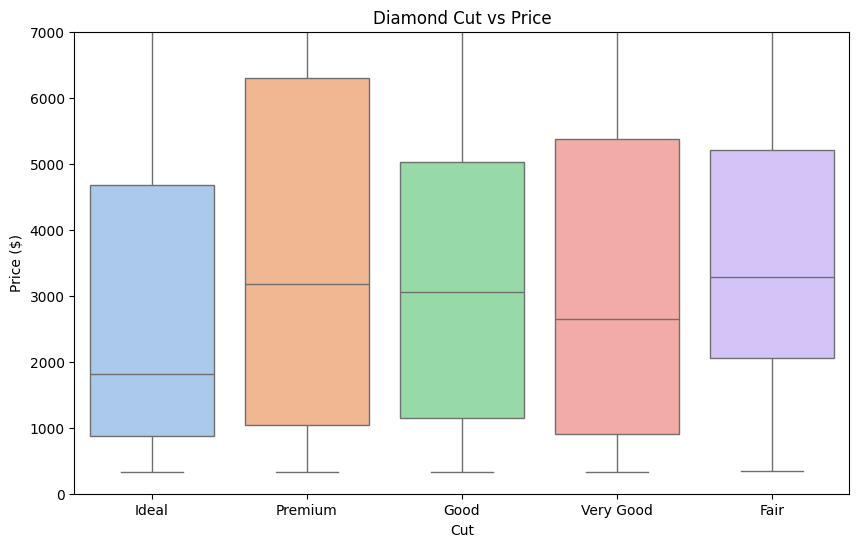

In [16]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='cut', y='price', palette='pastel')
plt.title('Diamond Cut vs Price')
plt.xlabel('Cut')
plt.ylabel('Price ($)')
plt.ylim(0, 7000) 
plt.show()

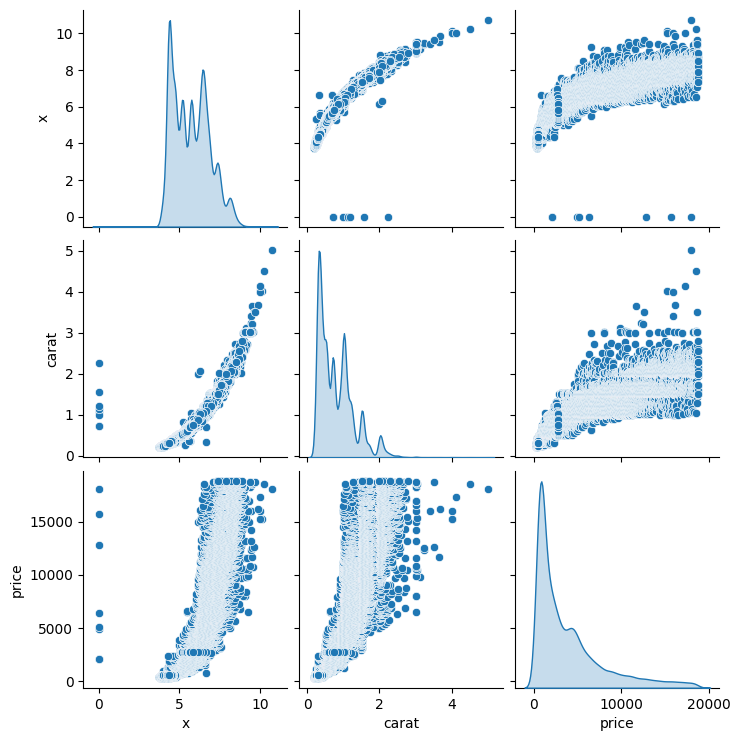

In [17]:
# Pairplot to visualize relationships between numerical variables
sns.pairplot(data=df[['x', 'carat', 'price']], diag_kind='kde')
plt.show()

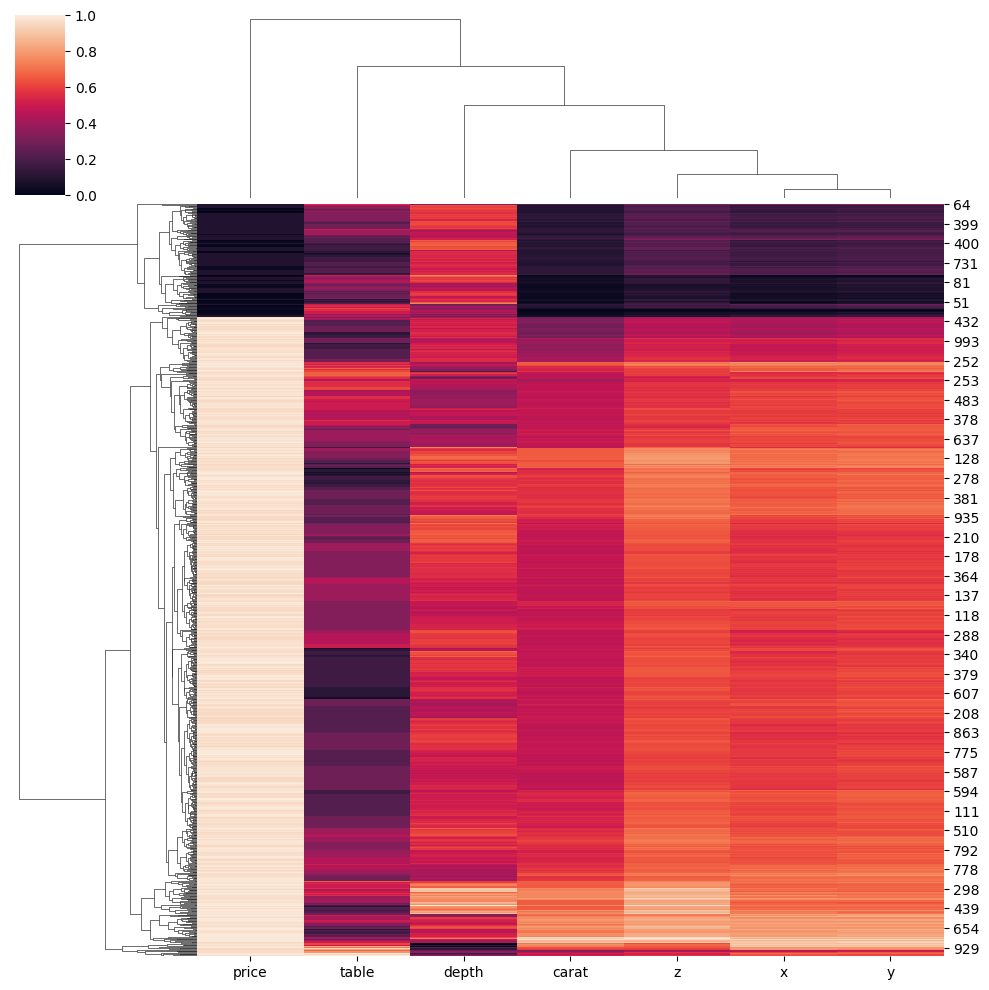

In [18]:
df_subset = df[['carat', 'depth', 'table', 'price', 'x', 'y', 'z']]
sns.clustermap(df_subset[:1000], standard_scale = 1)
plt.show()

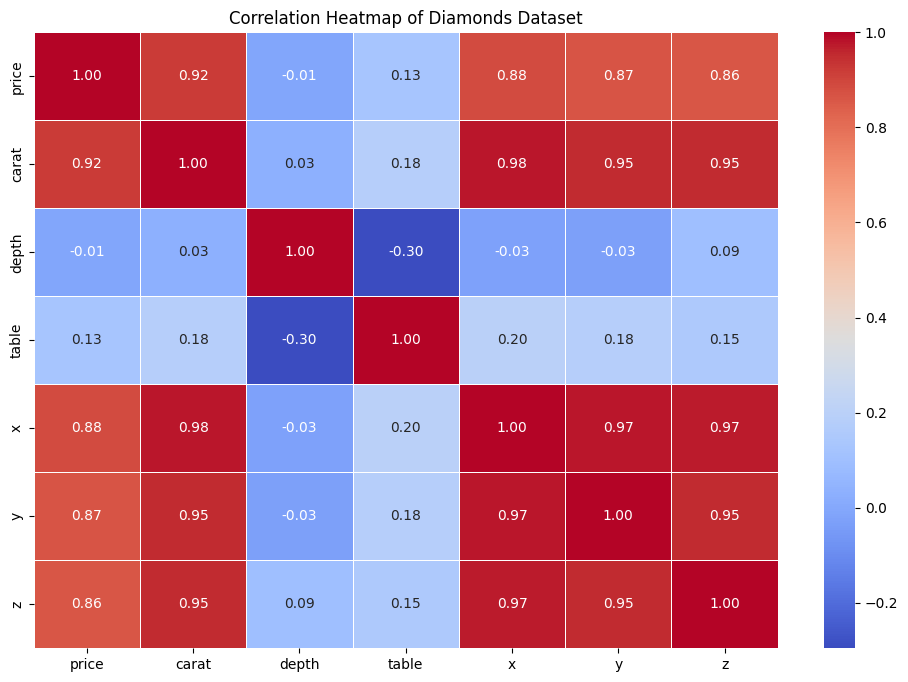

In [19]:
df = pd.read_csv('diamonds.csv') 
df = df[['price', 'carat', 'depth', 'table', 'x', 'y', 'z']]

correlation_matrix = df.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)

plt.title('Correlation Heatmap of Diamonds Dataset')
plt.show()


<Figure size 1200x800 with 0 Axes>

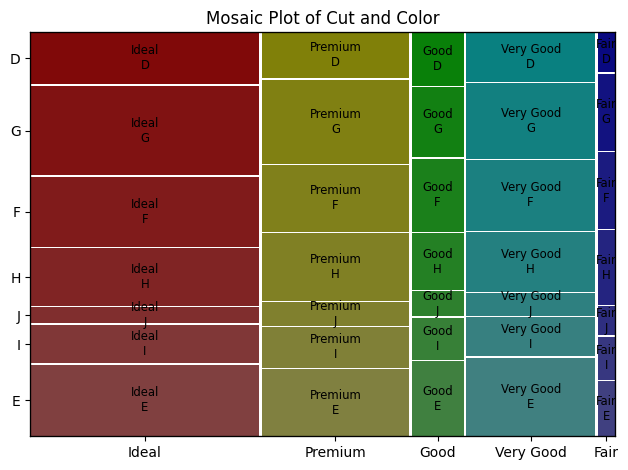

In [22]:
from statsmodels.graphics.mosaicplot import mosaic

# Mosaic plot for 'cut' and 'color'

# Increase figure size
plt.figure(figsize=(12, 8))

df = pd.read_csv('diamonds.csv') 
mosaic(df, ['cut', 'color'], title='Mosaic Plot of Cut and Color')

# Adjust layout to prevent cutting off labels and show the plot
plt.tight_layout()
plt.show()

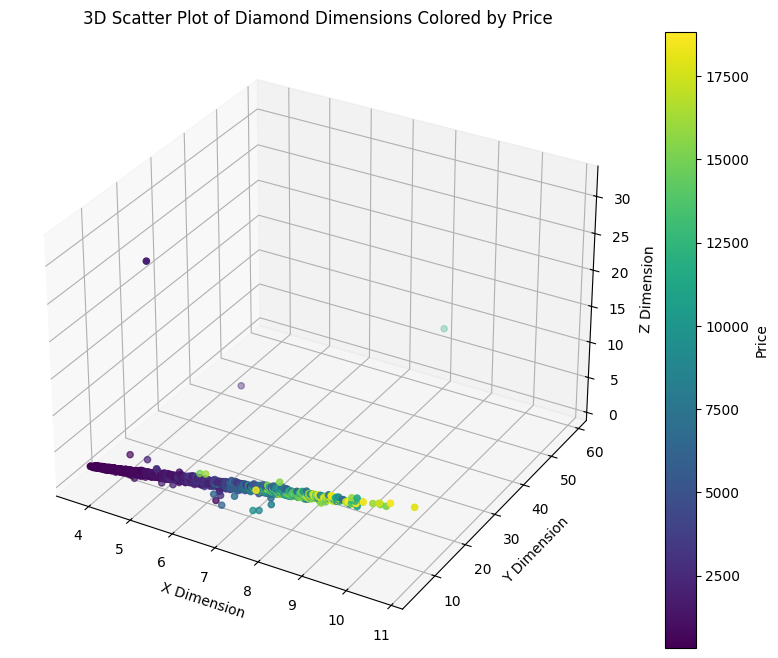

In [21]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

# Load and clean data as before
data = pd.read_csv('diamonds.csv')
data = data[(data['x'] != 0) & (data['y'] != 0) & (data['z'] != 0)]

# Create a 3D scatter plot colored by 'price'
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(data['x'], data['y'], data['z'], c=data['price'], cmap='viridis')
ax.set_xlabel('X Dimension')
ax.set_ylabel('Y Dimension')
ax.set_zlabel('Z Dimension')
ax.set_title('3D Scatter Plot of Diamond Dimensions Colored by Price')
fig.colorbar(sc, ax=ax, label='Price')

plt.show()

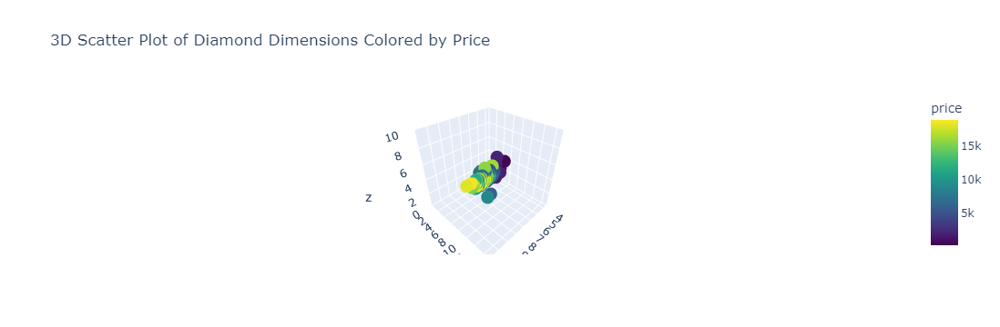

In [23]:
import plotly.express as px
import pandas as pd

# Load your dataset
df = pd.read_csv('diamonds.csv')

# Filter out rows with zeros in dimensions if not already cleaned
df = df[(df['x'] != 0) & (df['y'] != 0) & (df['z'] != 0)]

# Create a 3D scatter plot for x, y, z dimensions colored by price
fig = px.scatter_3d(df, x='x', y='y', z='z', color='price',
                    color_continuous_scale='Viridis',
                    title='3D Scatter Plot of Diamond Dimensions Colored by Price')

# Update the layout to limit y and z axes
fig.update_layout(scene=dict(
    yaxis=dict(range=[0, 15]),
    zaxis=dict(range=[0, 10])
))

fig.show()

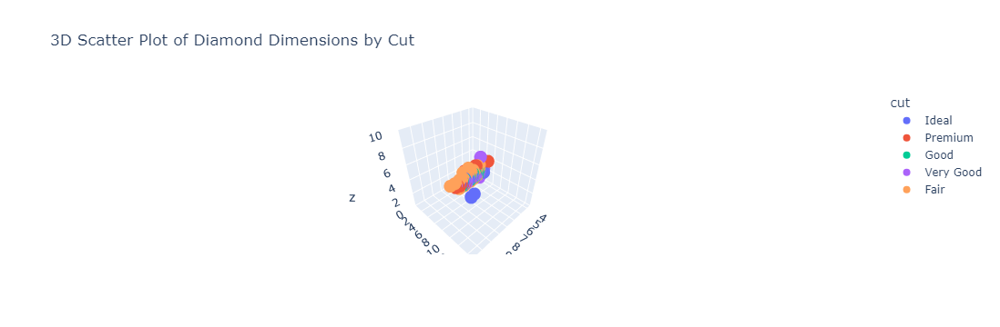

In [24]:
# For coloring by 'cut'
fig_cut = px.scatter_3d(df, x='x', y='y', z='z', color='cut',
                        title='3D Scatter Plot of Diamond Dimensions by Cut')

# Update the layout to limit y and z axes
fig_cut.update_layout(scene=dict(
    yaxis=dict(range=[0, 15]),
    zaxis=dict(range=[0, 10])
))

fig_cut.show()

In [25]:
# Prepare data
X = df[['x', 'y', 'z']]  # Features
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['cut'])  # Encode 'cut' as an integer

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train a decision tree
tree = DecisionTreeClassifier()
tree.fit(X_train, y_train)

# Print feature importances
print("Feature importances:", dict(zip(['x', 'y', 'z'], tree.feature_importances_)))

Feature importances: {'x': 0.3333067279910638, 'y': 0.31301109222886236, 'z': 0.3536821797800738}


Accuracy: 0.5612636003956478
Classification Report:
               precision    recall  f1-score   support

        Fair       0.73      0.72      0.72       505
        Good       0.53      0.56      0.55      1465
       Ideal       0.60      0.66      0.63      6518
     Premium       0.52      0.49      0.50      4068
   Very Good       0.50      0.45      0.47      3620

    accuracy                           0.56     16176
   macro avg       0.58      0.58      0.58     16176
weighted avg       0.56      0.56      0.56     16176



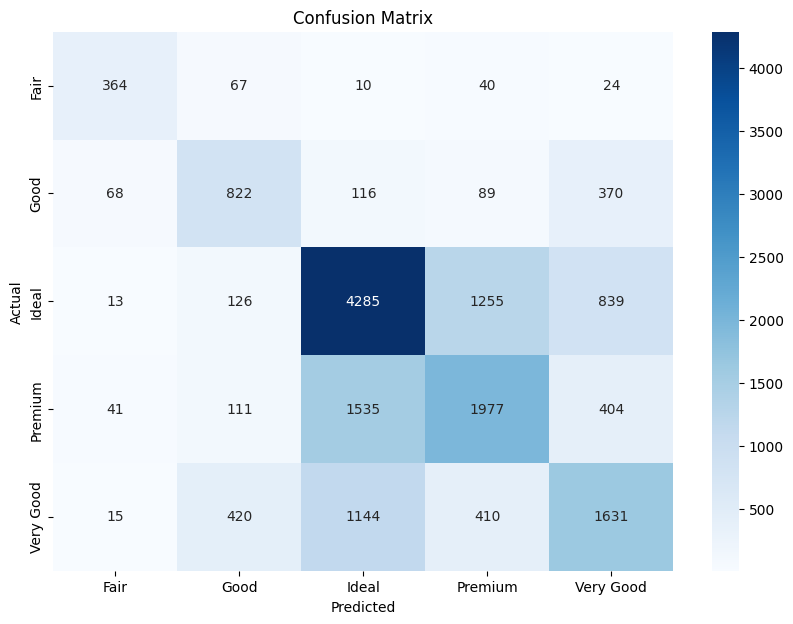

In [26]:
y_pred = tree.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

cut_names = label_encoder.inverse_transform(tree.classes_)

# Classification report
print("Classification Report:\n", classification_report(y_test, y_pred, target_names=label_encoder.classes_))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=cut_names, yticklabels=cut_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

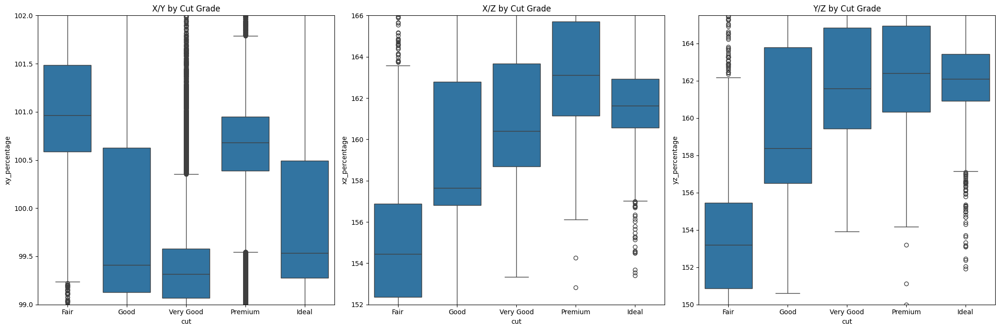

In [27]:
df = pd.read_csv('diamonds.csv')

df['xy_percentage'] = (df['x'] / df['y']) * 100
df['xz_percentage'] = (df['x'] / df['z']) * 100
df['yz_percentage'] = (df['y'] / df['z']) * 100

cut_order = ['Fair', 'Good', 'Very Good', 'Premium', 'Ideal']

fig, ax = plt.subplots(1, 3, figsize=(21, 7))

# 1
sns.boxplot(x='cut', y='xy_percentage', data = df, order = cut_order, ax = ax[0])
ax[0].set_title('X/Y by Cut Grade')
ax[0].set_ylim(99, 102)  

# 2
sns.boxplot(x='cut', y='xz_percentage', data = df, order = cut_order, ax = ax[1])
ax[1].set_title('X/Z by Cut Grade')
ax[1].set_ylim(152, 166)  

# 3
sns.boxplot(x='cut', y='yz_percentage', data = df, order = cut_order, ax = ax[2])
ax[2].set_title('Y/Z by Cut Grade')
ax[2].set_ylim(150, 165.5) 

plt.tight_layout()
plt.show()

##  ML for predicting price

In [28]:
df = pd.read_csv('diamonds.csv') 

X = df.drop('price', axis=1)
y = df['price']

In [29]:
categorical_features = ['cut', 'color', 'clarity']
numerical_features = ['carat', 'depth', 'table', 'x', 'y', 'z']

numerical_transformer = StandardScaler()

categorical_transformer = OneHotEncoder(drop='first', sparse=False)

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [30]:
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42, n_estimators=100),
    'Support Vector Regression': SVR(kernel='linear'),
    'Gradient Boosting': GradientBoostingRegressor(random_state=42),
}

model_performance = {}
model_details = {}

for model_name, model in models.items():
    pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('model', model)])
    print(f"\n=== Model {model_name} ===\n")
    print("Training...")
    pipeline.fit(X_train, y_train)

    model_details[model_name] = (model, pipeline)
    
    # Predict on the test set
    print("Predicting on test data...")
    y_pred = pipeline.predict(X_test)
    
    # Evaluate the model
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    med_ae = median_absolute_error(y_test, y_pred)

    model_performance[model_name] = dict()
    model_performance[model_name]['MAE'] = mae
    model_performance[model_name]['MSE'] = mse
    model_performance[model_name]['RMSE'] = rmse
    model_performance[model_name]['R2'] = r2
    model_performance[model_name]['MED_AE'] = med_ae
    
    print(f'Mean Absolute Error (MAE): {mae:.2f}')
    print(f'Mean Squared Error (MSE): {mse:.2f}')
    print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')
    print(f'R-squared (R2): {r2:.2f}')
    print(f'Median Absolute Error: {med_ae:.2f}')



=== Model Linear Regression ===

Training...
Predicting on test data...
Mean Absolute Error (MAE): 737.15
Mean Squared Error (MSE): 1288705.48
Root Mean Squared Error (RMSE): 1135.21
R-squared (R2): 0.92
Median Absolute Error: 526.00

=== Model Decision Tree ===

Training...
Predicting on test data...
Mean Absolute Error (MAE): 383.26
Mean Squared Error (MSE): 716342.19
Root Mean Squared Error (RMSE): 846.37
R-squared (R2): 0.95
Median Absolute Error: 129.00

=== Model Random Forest ===

Training...
Predicting on test data...
Mean Absolute Error (MAE): 296.68
Mean Squared Error (MSE): 408995.77
Root Mean Squared Error (RMSE): 639.53
R-squared (R2): 0.97
Median Absolute Error: 101.49

=== Model Support Vector Regression ===

Training...
Predicting on test data...
Mean Absolute Error (MAE): 787.31
Mean Squared Error (MSE): 2208847.56
Root Mean Squared Error (RMSE): 1486.22
R-squared (R2): 0.86
Median Absolute Error: 357.75

=== Model Gradient Boosting ===

Training...
Predicting on test

In [31]:
metrics_df = pd.DataFrame(model_performance).T
metrics_df = metrics_df.round(2)
metrics_df.columns = ['Mean Absolute Error (MAE)', 'Mean Squared Error (MSE)', 
                      'Root Mean Squared Error (RMSE)', 'R-squared (R2)', 
                      'Median Absolute Error']

metrics_df


,Mean Absolute Error (MAE),Mean Squared Error (MSE),Root Mean Squared Error (RMSE),R-squared (R2),Median Absolute Error
Linear Regression,737.15,1288705.48,1135.21,0.92,526.00
Decision Tree,383.26,716342.19,846.37,0.95,129.00
Random Forest,296.68,408995.77,639.53,0.97,101.49
Support Vector Regression,787.31,2208847.56,1486.22,0.86,357.75
Gradient Boosting,437.14,715907.75,846.11,0.95,192.12


### Feature importance

In [32]:
def plot_feature_importance(df, title):
    plt.figure(figsize=(10, 7))
    plt.barh(df['Feature'], df['Importance'])
    plt.xlabel('Importance')
    plt.title(title)
    plt.gca().invert_yaxis()
    plt.show()

#### Linear Regression

In [33]:
pipeline_lr = model_details['Linear Regression'][1]
feature_names = numerical_features + list(pipeline_lr.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_features))

coefficients = pipeline_lr.named_steps['model'].coef_

feature_importance_lr = pd.DataFrame({'Feature': feature_names, 'Importance': coefficients})
feature_importance_lr = feature_importance_lr.sort_values(by='Importance', key=abs, ascending=False)

print("Top 5 important features for Linear Regression")
print(feature_importance_lr[:5])


Top 5 important features for Linear Regression
         Feature   Importance
16    clarity_IF  5365.944596
0          carat  5339.601689
21  clarity_VVS1  5015.292916
22  clarity_VVS2  4958.211449
19   clarity_VS1  4579.905541


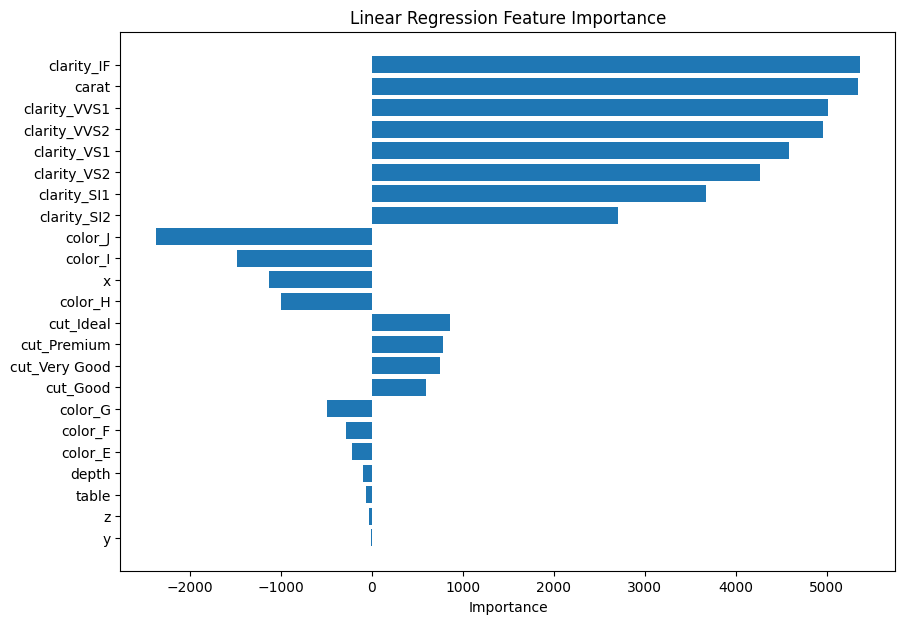

In [34]:
plot_feature_importance(feature_importance_lr, 'Linear Regression Feature Importance')


#### Decision Tree

In [35]:
pipeline_dt = model_details['Decision Tree'][1]

importances_dt = pipeline_dt.named_steps['model'].feature_importances_

feature_importance_dt = pd.DataFrame({'Feature': feature_names, 'Importance': importances_dt})
feature_importance_dt = feature_importance_dt.sort_values(by='Importance', ascending=False)

print("Top 5 important features for Decision Tree")
print(feature_importance_dt[:5])

Top 5 important features for Decision Tree
        Feature  Importance
0         carat    0.632488
4             y    0.254724
18  clarity_SI2    0.019472
17  clarity_SI1    0.013980
15      color_J    0.010947


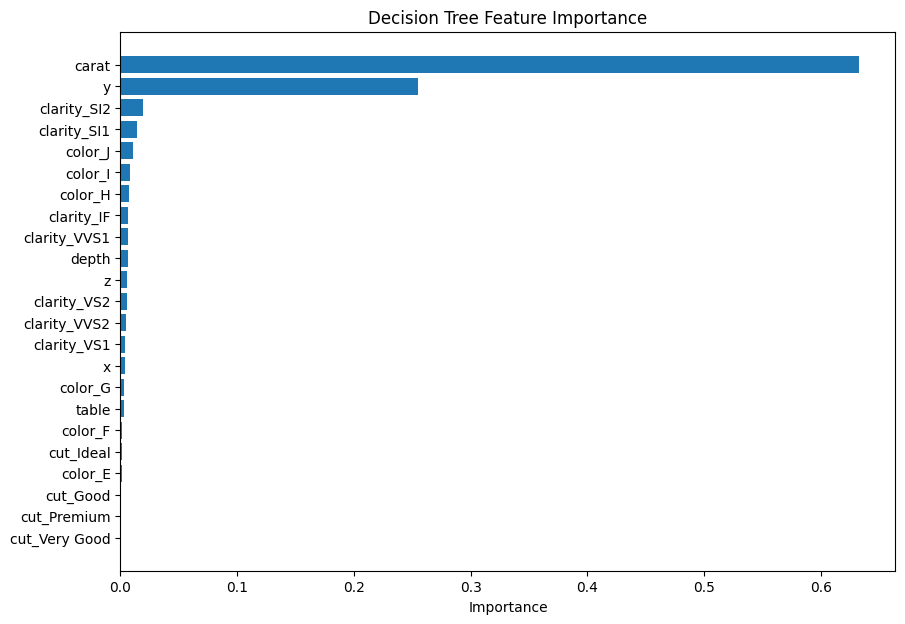

In [36]:
plot_feature_importance(feature_importance_dt, 'Decision Tree Feature Importance')

#### Random forest

In [37]:
pipeline_rf = model_details['Random Forest'][1]

importances_rf = pipeline_rf.named_steps['model'].feature_importances_

feature_importance_rf = pd.DataFrame({'Feature': feature_names, 'Importance': importances_rf})
feature_importance_rf = feature_importance_rf.sort_values(by='Importance', ascending=False)

print("Top 5 important features for Decision Tree")
print(feature_importance_rf[:5])

Top 5 important features for Decision Tree
        Feature  Importance
0         carat    0.612249
4             y    0.275360
18  clarity_SI2    0.019541
17  clarity_SI1    0.013876
15      color_J    0.011062


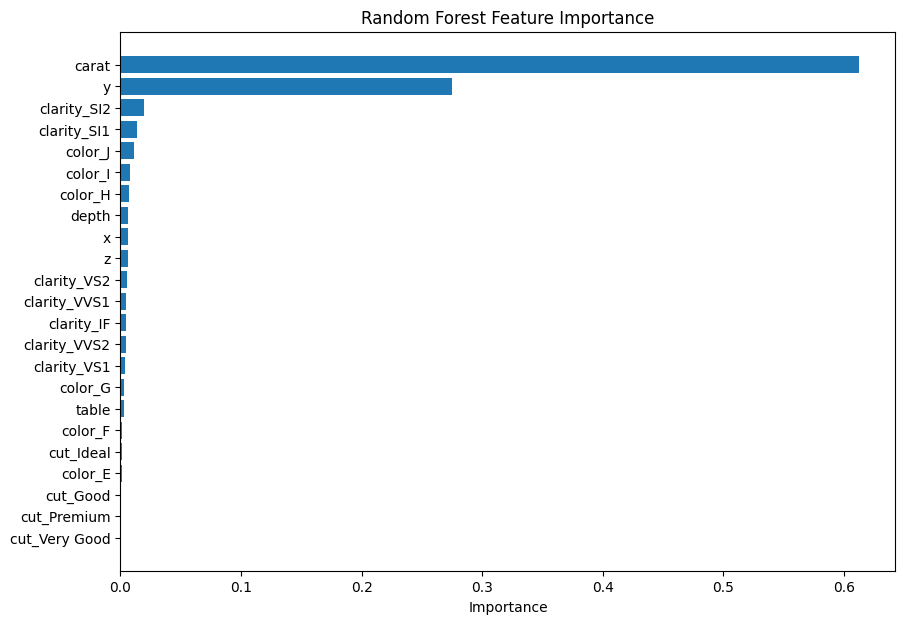

In [38]:
plot_feature_importance(feature_importance_rf, 'Random Forest Feature Importance')

#### Support Vector Regression

In [39]:
pipeline_svr = model_details['Support Vector Regression'][1]

importances_svr = pipeline_svr.named_steps['model'].coef_

feature_importance_svr = pd.DataFrame({'Feature': feature_names, 'Importance': importances_svr[0]})
feature_importance_svr = feature_importance_svr.sort_values(by='Importance', ascending=False)

print("Top 5 important features for Support Vector Regression")
print(feature_importance_svr[:5])

Top 5 important features for Support Vector Regression
         Feature   Importance
0          carat  3360.146058
16    clarity_IF   460.669304
21  clarity_VVS1   421.650509
22  clarity_VVS2   366.347190
19   clarity_VS1   210.402366


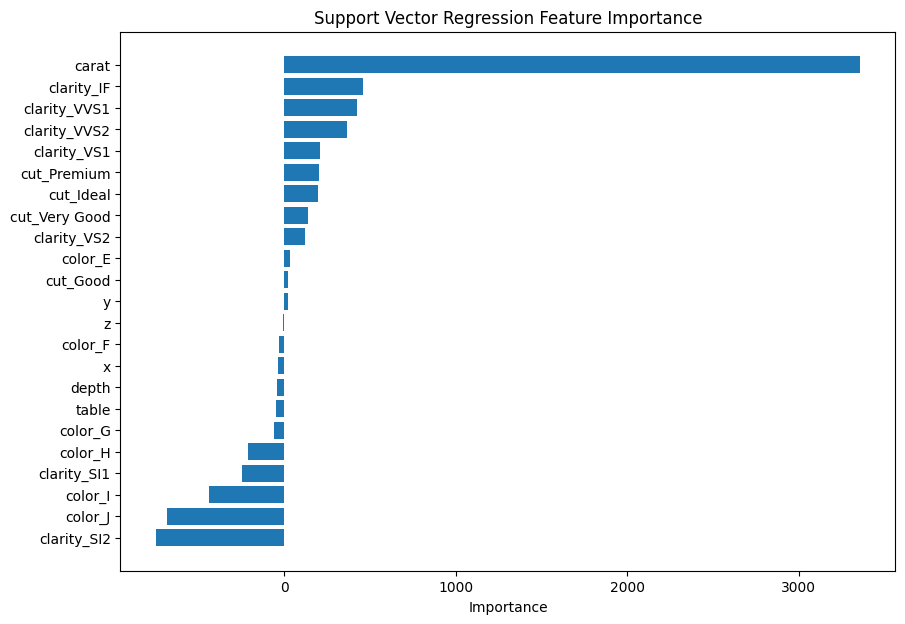

In [40]:
plot_feature_importance(feature_importance_svr, 'Support Vector Regression Feature Importance')

#### Gradient Boosting

In [41]:
pipeline_gb = model_details['Gradient Boosting'][1]

importances_gb = pipeline_gb.named_steps['model'].feature_importances_

feature_importance_gb = pd.DataFrame({'Feature': feature_names, 'Importance': importances_gb})
feature_importance_gb = feature_importance_gb.sort_values(by='Importance', ascending=False)

print("Top 5 important features for Gradient Boosting")
print(feature_importance_gb[:5])

Top 5 important features for Gradient Boosting
        Feature  Importance
4             y    0.656467
0         carat    0.239560
5             z    0.028422
18  clarity_SI2    0.014664
3             x    0.011312


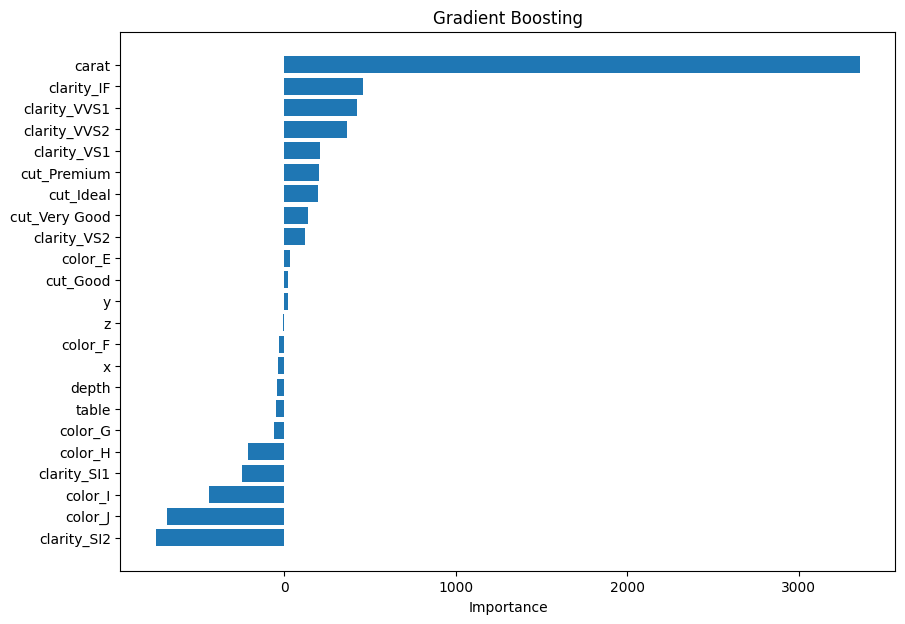

In [42]:
plot_feature_importance(feature_importance_svr, 'Gradient Boosting')

#### Top 5 most important features from each model

In [43]:
top_most_imp_features_dict = {}
top_most_imp_features_dict['Linear Regression'] = feature_importance_lr[:5].Feature.tolist()
top_most_imp_features_dict['Decision Tree'] = feature_importance_dt[:5].Feature.tolist()
top_most_imp_features_dict['Random Forest'] = feature_importance_rf[:5].Feature.tolist()
top_most_imp_features_dict['Support Vector Regression'] = feature_importance_svr[:5].Feature.tolist()
top_most_imp_features_dict['Gradient Boosting'] = feature_importance_gb[:5].Feature.tolist()

In [44]:
top_most_imp_features_df = pd.DataFrame(top_most_imp_features_dict)
top_most_imp_features_df

,Linear Regression,Decision Tree,Random Forest,Support Vector Regression,Gradient Boosting
0,clarity_IF,carat,carat,carat,y
1,carat,y,y,clarity_IF,carat
2,clarity_VVS1,clarity_SI2,clarity_SI2,clarity_VVS1,z
3,clarity_VVS2,clarity_SI1,clarity_SI1,clarity_VVS2,clarity_SI2
4,clarity_VS1,color_J,color_J,clarity_VS1,x


#### Top 5 least important features from each model

In [45]:
least_imp_features_dict = {}
least_imp_features_dict['Linear Regression'] = feature_importance_lr[-5:][::-1].Feature.tolist()
least_imp_features_dict['Decision Tree'] = feature_importance_dt[-5:][::-1].Feature.tolist()
least_imp_features_dict['Random Forest'] = feature_importance_rf[-5:][::-1].Feature.tolist()
least_imp_features_dict['Support Vector Regression'] = feature_importance_svr[-5:][::-1].Feature.tolist()
least_imp_features_dict['Gradient Boosting'] = feature_importance_gb[-5:][::-1].Feature.tolist()

In [46]:
least_imp_features_df = pd.DataFrame(least_imp_features_dict)
least_imp_features_df

,Linear Regression,Decision Tree,Random Forest,Support Vector Regression,Gradient Boosting
0,y,cut_Very Good,cut_Very Good,clarity_SI2,cut_Very Good
1,z,cut_Premium,cut_Premium,color_J,cut_Premium
2,table,cut_Good,cut_Good,color_I,cut_Good
3,depth,color_E,color_E,clarity_SI1,table
4,color_E,cut_Ideal,cut_Ideal,color_H,color_E


### Clustering

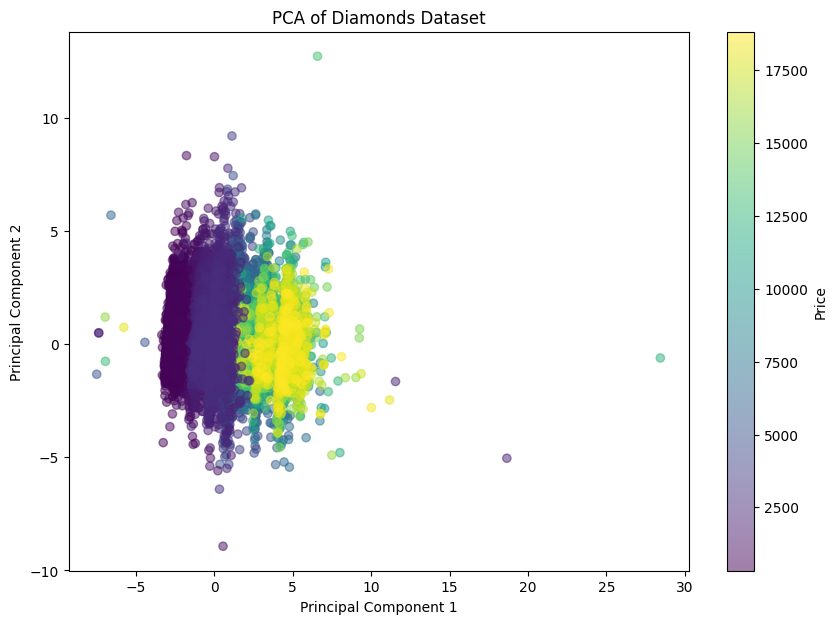

In [47]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

X_processed = preprocessor.fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_processed)

plt.figure(figsize=(10, 7))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='viridis', alpha=0.5)
plt.colorbar(label='Price')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of Diamonds Dataset')
plt.show()


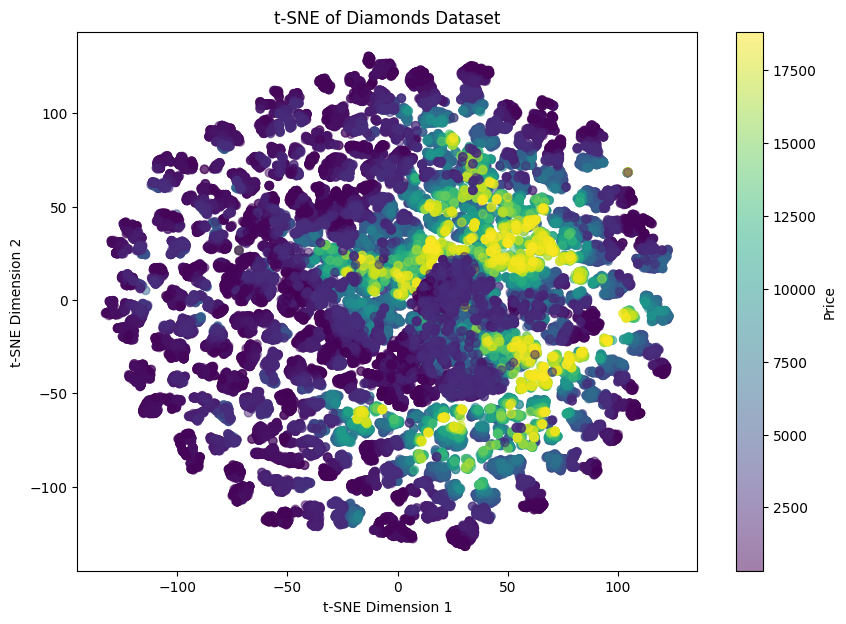

In [48]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_processed)

plt.figure(figsize=(10, 7))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y, cmap='viridis', alpha=0.5)
plt.colorbar(label='Price')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('t-SNE of Diamonds Dataset')
plt.show()


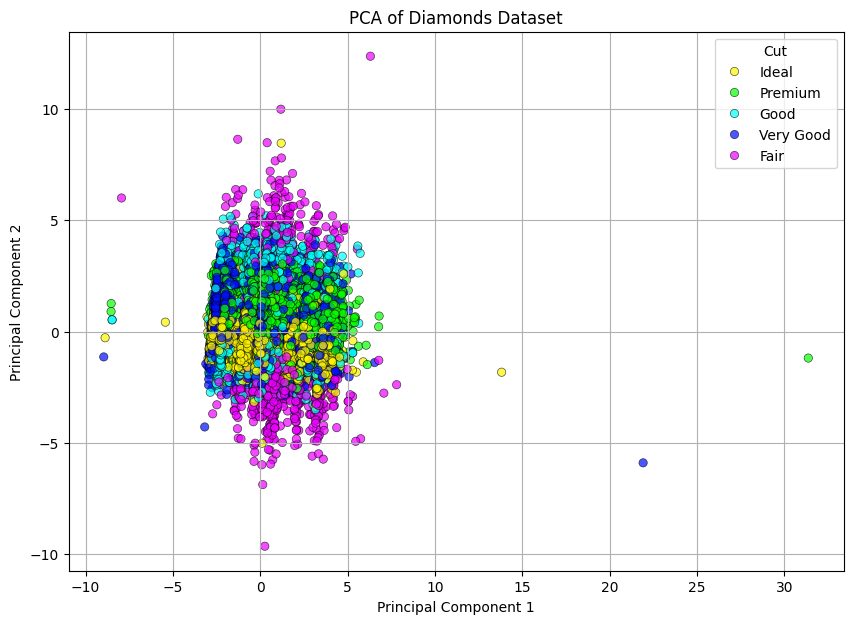

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

df = pd.read_csv('diamonds.csv') 

features = ['table', 'depth', 'x', 'y', 'z']
X = df[features]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2)  # We want to reduce to 2 components for visualization
principal_components = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

pca_df['cut'] = df['cut']

plt.figure(figsize=(10, 7))
sns.scatterplot(
    x='PC1', y='PC2',
    hue='cut',
    palette=sns.color_palette("hsv", df['cut'].nunique()),
    data=pca_df,
    alpha=0.7,
    edgecolor='k'
)

plt.title('PCA of Diamonds Dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cut')
plt.grid(True)
plt.show()


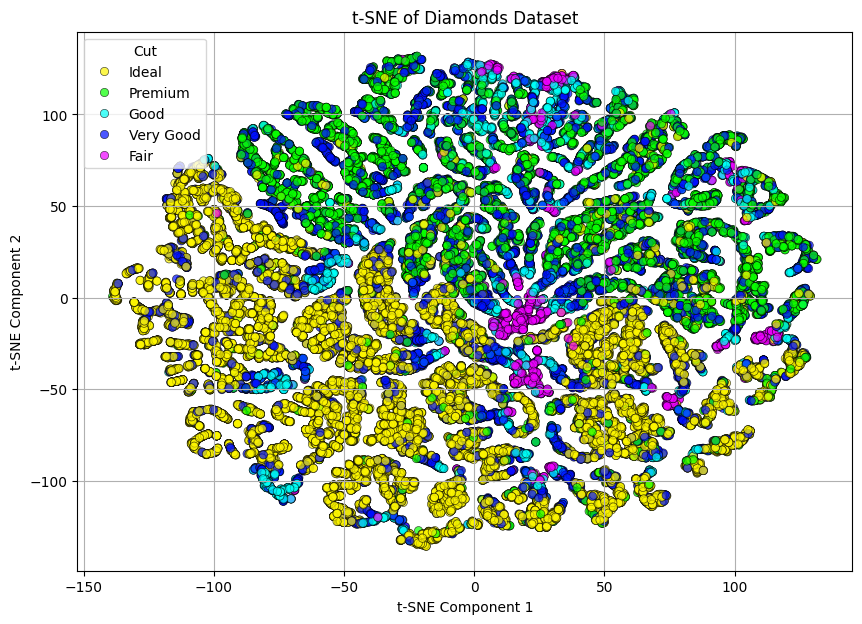

In [50]:
features = ['depth', 'table', 'x', 'y', 'z']
X = df[features]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

tsne = TSNE(n_components=2, random_state=42)  
tsne_components = tsne.fit_transform(X_scaled)
tsne_df = pd.DataFrame(data=tsne_components, columns=['TSNE1', 'TSNE2'])

tsne_df['cut'] = df['cut']

plt.figure(figsize=(10, 7))
sns.scatterplot(
    x='TSNE1', y='TSNE2',
    hue='cut',
    palette=sns.color_palette("hsv", df['cut'].nunique()),
    data=tsne_df,
    alpha=0.7,
    edgecolor='k'
)

plt.title('t-SNE of Diamonds Dataset')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cut')
plt.grid(True)
plt.show()


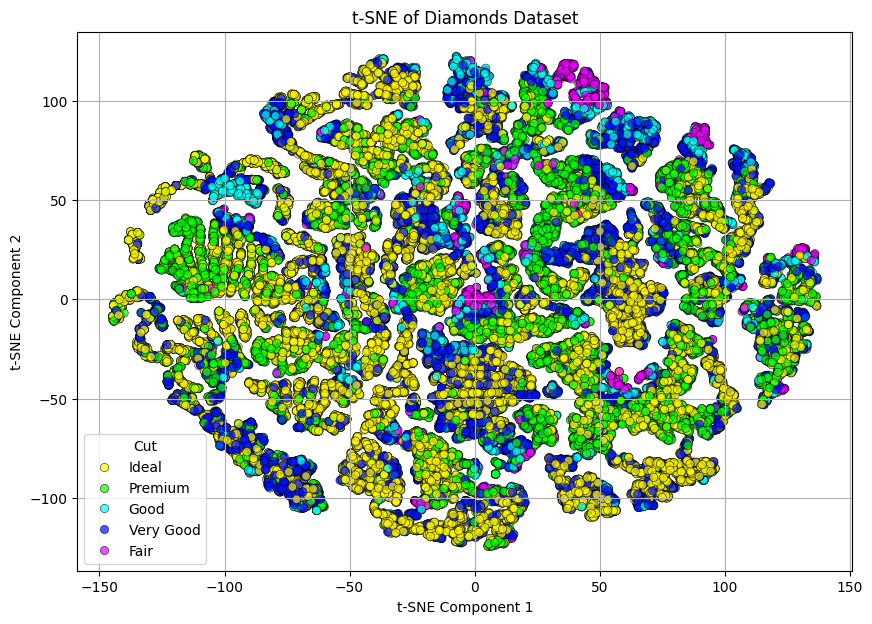

In [51]:
features = ['x', 'y', 'z']
X = df[features]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

tsne = TSNE(n_components=2, random_state=42)  
tsne_components = tsne.fit_transform(X_scaled)
tsne_df = pd.DataFrame(data=tsne_components, columns=['TSNE1', 'TSNE2'])

tsne_df['cut'] = df['cut']

plt.figure(figsize=(10, 7))
sns.scatterplot(
    x='TSNE1', y='TSNE2',
    hue='cut',
    palette=sns.color_palette("hsv", df['cut'].nunique()),
    data=tsne_df,
    alpha=0.7,
    edgecolor='k'
)

plt.title('t-SNE of Diamonds Dataset')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cut')
plt.grid(True)
plt.show()